# Tugas Analisis Multimedia: **Image (Citra Digital)**

**Mata Kuliah:** Sistem & Teknologi Multimedia  
**Nama:** Aziz Kurniawan <br>
**NIM:** 122140097 <br>
**Link GitHub:** [https://github.com/azizkurniawan](https://github.com/Aziz097/Multimedia-System-and-Technology)

---

## Deskripsi Tugas

Tugas ini bertujuan untuk memahami **representasi dasar data citra digital (image)** melalui praktik langsung memuat data, visualisasi komponen warna, serta melakukan analisis spasial sederhana menggunakan berbagai teknik dasar pengolahan citra.

Anda akan bekerja dengan satu atau beberapa gambar (foto diri, objek, atau lingkungan sekitar) untuk:

* Mengamati struktur data piksel dan channel warna (RGB, Grayscale, HSV, dsb.)
* Menganalisis perbedaan hasil visualisasi antar representasi warna
* Melakukan eksplorasi sederhana terhadap transformasi citra (cropping, filtering, edge detection, dll.)
* Menyimpulkan pengaruh setiap tahap pemrosesan terhadap persepsi visual

Fokus tugas ini adalah pada **pemahaman konsep representasi spasial citra digital** dan **interpretasi hasil visualisasi**, **bukan** pada manipulasi kompleks atau penerapan model pembelajaran mesin.

---

### **Soal 1 — Cropping dan Konversi Warna**

* Ambil sebuah gambar diri Anda (*selfie*) menggunakan kamera atau smartphone.
* Lakukan **cropping secara manual** untuk menghasilkan dua potongan:

  * Cropping **kotak persegi pada area wajah**.
  * Cropping **persegi panjang pada area latar belakang**.
* Resize hasil crop menjadi **920×920 piksel**.
* Konversi gambar menjadi **grayscale** dan **HSV**, lalu tampilkan ketiganya berdampingan.
* Tambahkan **anotasi teks** berisi nama Anda di atas kepala pada gambar hasil crop.

  * Gaya teks (font, warna, posisi, ukuran, ketebalan) **dibebaskan**.
* Jelaskan efek **cropping** dan **perubahan warna** menggunakan **Markdown**.


In [16]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

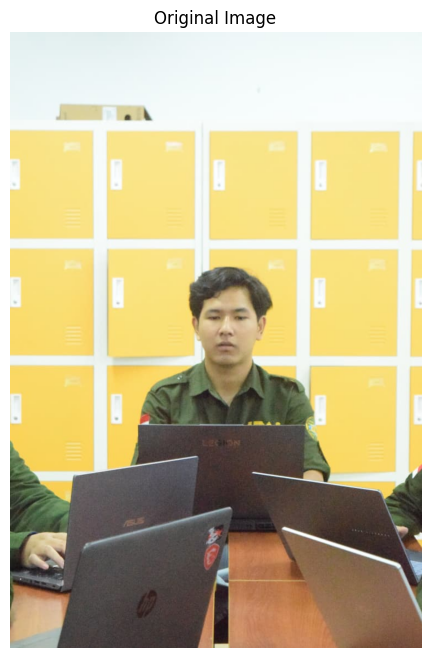

In [17]:
# Load selfie image 
image_path = os.path.join('assets_ws4', 'selfie.jpeg')
image = cv2.imread(image_path)

if image is None:
    print("Error: Image not found. Please place your selfie in assets_ws4/selfie.jpg")
else:
    # Convert from BGR (OpenCV default) to RGB (matplotlib format)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display original image
    plt.figure(figsize=(10, 8))
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    plt.show()

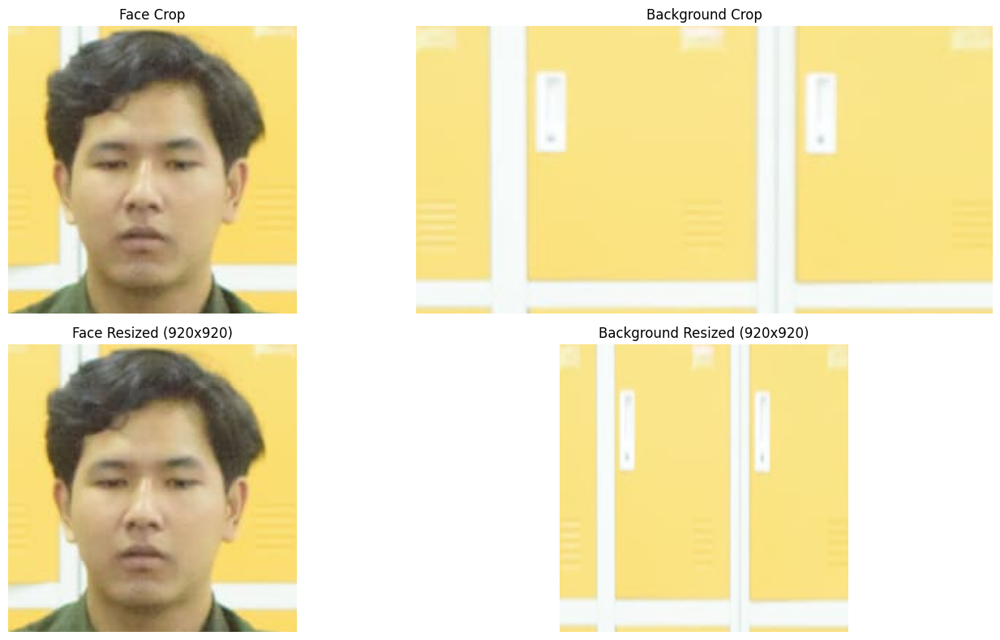

In [18]:
# coordinates for face (square)
face_x, face_y, face_size = 300, 425, 200
face_crop = image_rgb[face_y:face_y+face_size, face_x:face_x+face_size]

# coordinates for background (rectangle)
bg_x, bg_y, bg_width, bg_height = 100, 200, 400, 200
bg_crop = image_rgb[bg_y:bg_y+bg_height, bg_x:bg_x+bg_width]

# Resize both crops to 920x920
face_resized = cv2.resize(face_crop, (920, 920), interpolation=cv2.INTER_AREA)
bg_resized = cv2.resize(bg_crop, (920, 920), interpolation=cv2.INTER_AREA)

# Display cropped and resized images
fig, axes = plt.subplots(2, 2, figsize=(15, 8))
axes[0, 0].imshow(face_crop)
axes[0, 0].set_title('Face Crop')
axes[0, 0].axis('off')
axes[0, 1].imshow(bg_crop)
axes[0, 1].set_title('Background Crop')
axes[0, 1].axis('off')
axes[1, 0].imshow(face_resized)
axes[1, 0].set_title('Face Resized (920x920)')
axes[1, 0].axis('off')
axes[1, 1].imshow(bg_resized)
axes[1, 1].set_title('Background Resized (920x920)')
axes[1, 1].axis('off')
plt.tight_layout()
plt.show()

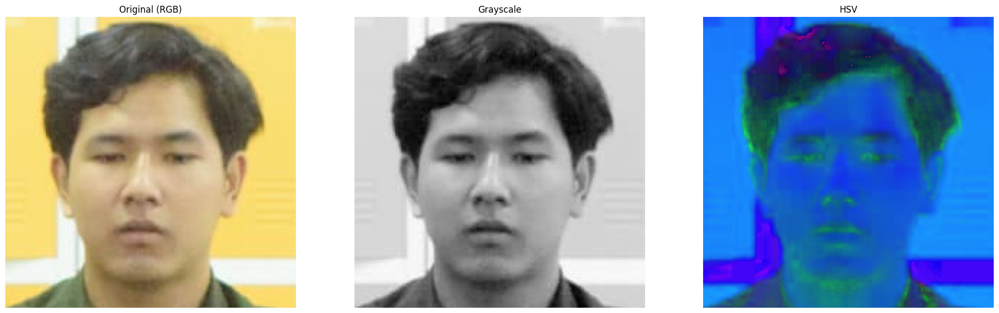

In [19]:
# Convert face crop to grayscale and HSV, display side by side
# Grayscale conversion
face_gray = cv2.cvtColor(face_resized, cv2.COLOR_RGB2GRAY)

# HSV conversion
face_hsv = cv2.cvtColor(face_resized, cv2.COLOR_RGB2HSV)

# Display all three versions
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
axes[0].imshow(face_resized)
axes[0].set_title('Original (RGB)')
axes[0].axis('off')
axes[1].imshow(face_gray, cmap='gray')
axes[1].set_title('Grayscale')
axes[1].axis('off')
axes[2].imshow(face_hsv)
axes[2].set_title('HSV')
axes[2].axis('off')
plt.tight_layout()
plt.savefig('results_ws4/color_conversions.jpg')
plt.show()

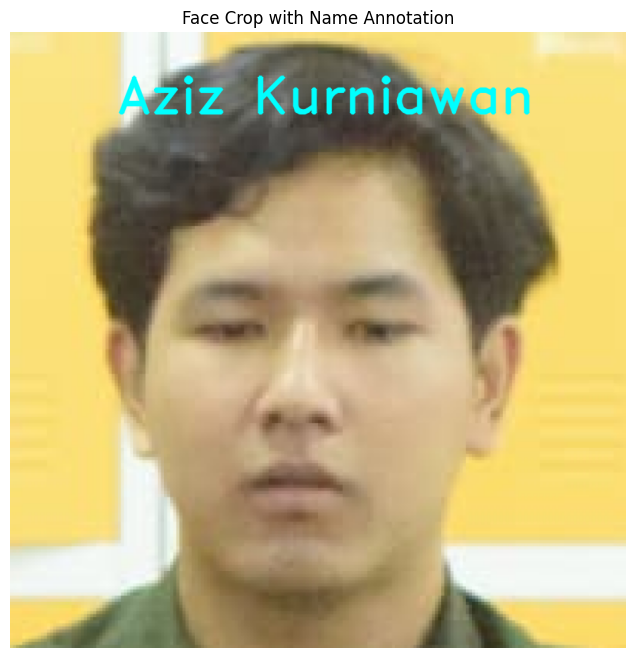

True

In [20]:
# Add text annotation with my name
# Create a copy to add text
face_with_text = face_resized.copy()

# Add text 
text = "Aziz Kurniawan"  
position = (160, 120)  # Position above head (x, y)
font = cv2.FONT_HERSHEY_DUPLEX
font_scale = 2.5
color = (0, 255, 255)  # Cyan color in RGB
thickness = 4
line_type = cv2.LINE_AA

cv2.putText(face_with_text, text, position, font, font_scale, color, thickness, line_type)

# Display image with text
plt.figure(figsize=(8, 8))
plt.imshow(face_with_text)
plt.title('Face Crop with Name Annotation')
plt.axis('off')
plt.show()

# Save the result
cv2.imwrite('results_ws4/face_with_text.jpg', cv2.cvtColor(face_with_text, cv2.COLOR_RGB2BGR))

#### Penjelasan efek **cropping** dan **perubahan warna**

**Efek Cropping:**
- **Cropping persegi pada area wajah** memungkinkan kita untuk fokus pada region of interest (ROI) tertentu, dalam hal ini adalah wajah. Dengan melakukan crop, kita mengisolasi bagian penting dari gambar dan menghilangkan informasi yang tidak relevan.
- **Cropping persegi panjang pada latar belakang** menunjukkan bahwa cropping tidak harus berbentuk persegi - kita dapat menyesuaikan dimensi sesuai kebutuhan. Ini berguna untuk mengekstrak konteks atau background patterns.
- **Resize ke 920×920 piksel** memastikan dimensi output konsisten dan seragam, yang penting untuk pemrosesan lebih lanjut atau komparasi antar gambar.

**Efek Perubahan Warna (Color Space Conversion):**

1. **RGB (Original)**: Representasi warna natural yang terdiri dari 3 channel (Red, Green, Blue). Setiap piksel memiliki intensitas untuk masing-masing channel dengan range 0-255. RGB adalah format standar untuk display dan paling intuitif bagi manusia.

2. **Grayscale**: Konversi ke grayscale menghilangkan informasi warna dan hanya mempertahankan intensitas cahaya (luminance). Gambar grayscale hanya memiliki 1 channel dengan nilai 0 (hitam) sampai 255 (putih). Konversi ini berguna untuk:
   - Mengurangi kompleksitas komputasi (dari 3 channel menjadi 1)
   - Fokus pada struktur dan tekstur tanpa gangguan warna
   - Preprocessing untuk algoritma computer vision seperti edge detection

3. **HSV (Hue, Saturation, Value)**: 
   - **Hue (H)**: Representasi warna murni (0-180° dalam OpenCV), lebih intuitif untuk memisahkan objek berdasarkan warna
   - **Saturation (S)**: Intensitas/kemurnian warna (0-255), menunjukkan seberapa jenuh warna tersebut
   - **Value (V)**: Brightness/kecerahan (0-255), menunjukkan seberapa terang warna tersebut
   - HSV lebih cocok untuk color-based segmentation karena memisahkan informasi warna dari pencahayaan

**Penambahan Anotasi Teks:**
Anotasi teks dengan `cv2.putText()` memungkinkan kita menambahkan label atau informasi pada gambar. Pemilihan font, warna, dan posisi yang tepat memastikan teks terbaca dengan jelas tanpa mengganggu konten utama gambar.

---

### **Soal 2 — Manipulasi Channel Warna RGB**

* Gunakan gambar hasil crop dari Soal 1.
* Konversikan gambar ke ruang warna **RGB**.
* Lakukan manipulasi channel warna dengan cara:

  * **Naikkan intensitas channel merah sebanyak 50 poin** (maksimum 255).
  * **Turunkan intensitas channel biru sebanyak 30 poin** (minimum 0).
* Teknik atau cara menaikkan/menurunkan intensitas **dibebaskan**, asalkan logis dan hasilnya terlihat.
* Gabungkan kembali channel warna dan **simpan gambar hasil modifikasi dalam format `.png`**.
* **Tampilkan histogram per channel (R, G, B)** untuk gambar asli dan hasil modifikasi menggunakan `matplotlib.pyplot.hist`.
* Jelaskan dampak perubahan RGB pada warna gambar dalam sel **Markdown**.


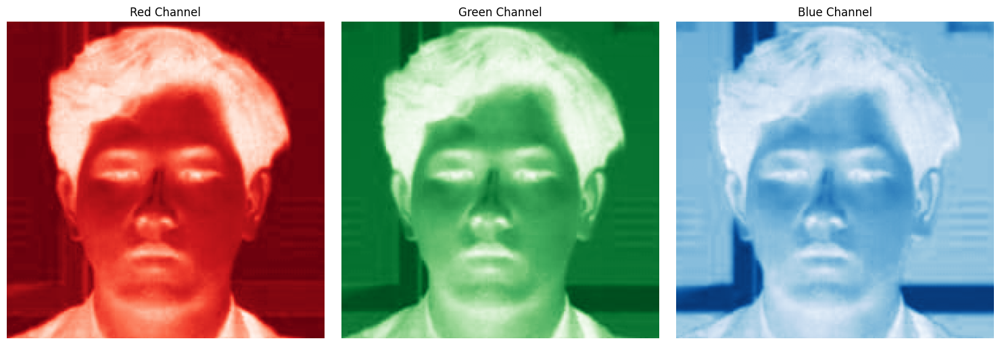

In [21]:
# Prepare image for channel manipulation
# Use the face crop from Problem 1
face_original = face_resized.copy()

# Split RGB channels
r_channel, g_channel, b_channel = cv2.split(face_original)

# Display individual channels
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(r_channel, cmap='Reds')
axes[0].set_title('Red Channel')
axes[0].axis('off')
axes[1].imshow(g_channel, cmap='Greens')
axes[1].set_title('Green Channel')
axes[1].axis('off')
axes[2].imshow(b_channel, cmap='Blues')
axes[2].set_title('Blue Channel')
axes[2].axis('off')
plt.tight_layout()
plt.show()

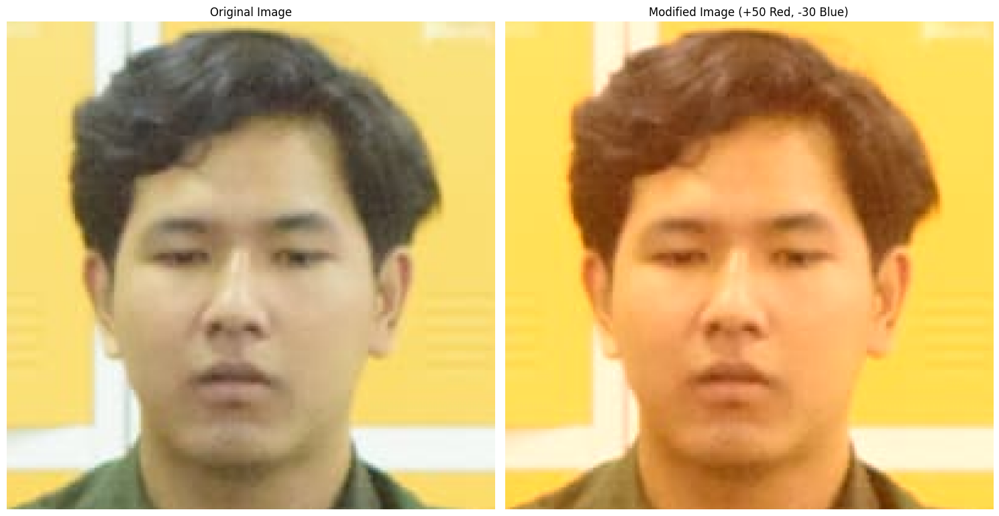

True

In [22]:
# Manipulate color channels
# Increase red channel by 50 points (capped at 255)
r_channel_adjusted = np.clip(r_channel.astype(np.int16) + 50, 0, 255).astype(np.uint8)

# Decrease blue channel by 30 points (capped at 0)
b_channel_adjusted = np.clip(b_channel.astype(np.int16) - 30, 0, 255).astype(np.uint8)

# Merge channels back together
modified_face = cv2.merge([r_channel_adjusted, g_channel, b_channel_adjusted])

# Display comparison
fig, axes = plt.subplots(1, 2, figsize=(15, 8))
axes[0].imshow(face_original)
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(modified_face)
axes[1].set_title('Modified Image (+50 Red, -30 Blue)')
axes[1].axis('off')
plt.tight_layout()
plt.show()

# Save the result
cv2.imwrite('results_ws4/modified_face.png', cv2.cvtColor(modified_face, cv2.COLOR_RGB2BGR))

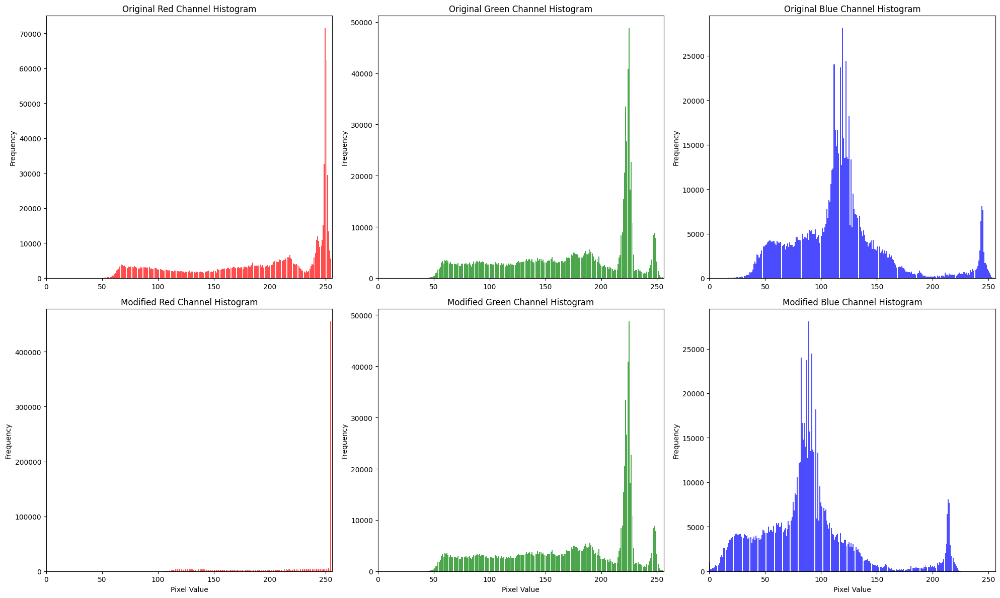

In [23]:
# Display histograms for original and modified images
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Colors and titles for channels
colors = ['r', 'g', 'b']
titles = ['Red Channel', 'Green Channel', 'Blue Channel']

# Plot histograms for original image
for i in range(3):
    axes[0, i].hist(face_original[:, :, i].ravel(), bins=256, color=colors[i], alpha=0.7)
    axes[0, i].set_title(f'Original {titles[i]} Histogram')
    axes[0, i].set_xlim([0, 256])
    axes[0, i].set_ylabel('Frequency')

# Plot histograms for modified image
for i in range(3):
    channel_data = modified_face[:, :, i].ravel()
    axes[1, i].hist(channel_data, bins=256, color=colors[i], alpha=0.7)
    axes[1, i].set_title(f'Modified {titles[i]} Histogram')
    axes[1, i].set_xlim([0, 256])
    axes[1, i].set_xlabel('Pixel Value')
    axes[1, i].set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('results_ws4/channel_histograms.jpg')
plt.show()

#### Dampak Perubahan RGB pada Warna Gambar

**Analisis Manipulasi Channel RGB:**

1. **Peningkatan Red Channel (+50 poin):**
   - Menambahkan 50 poin pada channel merah membuat gambar memiliki **tone kemerahan yang lebih dominan**
   - Warna kulit menjadi lebih warm/hangat dengan nuansa kemerahan yang lebih kuat
   - Objek yang sebelumnya memiliki komponen merah akan menjadi lebih cerah dan vibrant
   - Pada histogram, distribusi nilai red channel **bergeser ke kanan** (nilai yang lebih tinggi), menunjukkan peningkatan intensitas merah secara keseluruhan

2. **Penurunan Blue Channel (-30 poin):**
   - Mengurangi 30 poin pada channel biru membuat gambar kehilangan **cool tone** dan mengurangi nuansa kebiruan
   - Bayangan dan area gelap yang biasanya memiliki komponen biru tinggi menjadi lebih hangat
   - Kontras antara highlight dan shadow berubah karena blue channel berkontribusi pada persepsi depth
   - Pada histogram, distribusi blue channel **bergeser ke kiri** (nilai yang lebih rendah), menunjukkan penurunan intensitas biru

3. **Efek Gabungan (+50 Red, -30 Blue, Green tetap):**
   - Kombinasi ini menciptakan **warm color cast** dengan dominasi warna merah-kuning (karena green tetap, red naik, blue turun)
   - Gambar terlihat seperti difoto dengan **warm white balance** atau sunset lighting
   - Color temperature bergeser dari neutral ke warm/orange tone
   - Efek ini sering digunakan untuk memberi kesan hangat, vintage, atau golden hour

**Penggunaan `np.clip()`:**
Fungsi `np.clip()` sangat penting untuk memastikan nilai piksel tetap dalam range valid (0-255):
- Mencegah **overflow** (nilai > 255 dikembalikan ke 255)
- Mencegah **underflow** (nilai < 0 dikembalikan ke 0)
- Menjaga integritas data dan mencegah artifacts pada gambar

**Observasi Histogram:**
Histogram menunjukkan distribusi frekuensi nilai piksel untuk setiap channel:
- **Peak shifts**: Pergeseran puncak histogram mengindikasikan perubahan nilai dominan
- **Spread changes**: Perubahan sebaran menunjukkan perubahan kontras
- Histogram adalah tool powerful untuk analisis kuantitatif perubahan warna

---

### **Soal 3 — Deteksi Tepi dan Filter Citra**

* Ambil gambar **objek dengan background bertekstur** (misalnya kain bermotif, jerami, atau batu).
* Terapkan **edge detection (Canny)** dan tampilkan hasilnya.
* Lakukan **thresholding dengan nilai ambang tertentu** (bebas Anda tentukan) agar hanya objek utama yang tersisa.
* Buat **bounding box** di sekitar objek hasil segmentasi (boleh manual atau otomatis).
* Terapkan **filter blur** dan **filter sharpening**, lalu **bandingkan hasil keduanya**.
* Jelaskan bagaimana setiap filter memengaruhi detail gambar dalam format **Markdown**.


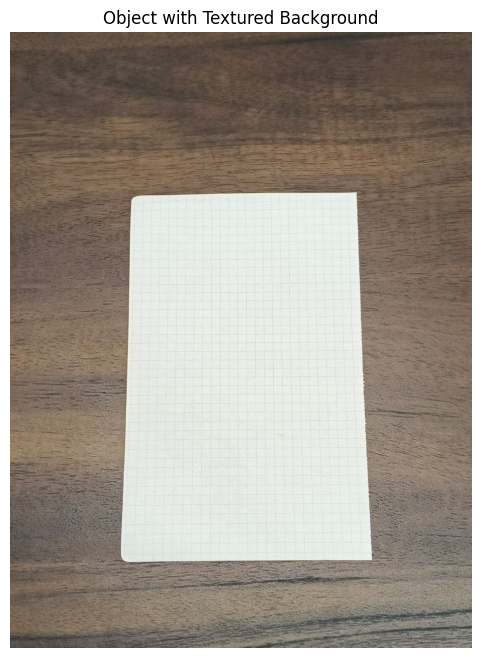

In [24]:
# Load object image with textured background
object_path = os.path.join('assets_ws4', 'textured_object.jpeg')
object_img = cv2.imread(object_path)

if object_img is None:
    print("Error: Object image not found. Please place your image in assets_ws4/textured_object.jpeg")
else:
    object_rgb = cv2.cvtColor(object_img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(object_rgb)
    plt.title('Object with Textured Background')
    plt.axis('off')
    plt.show()

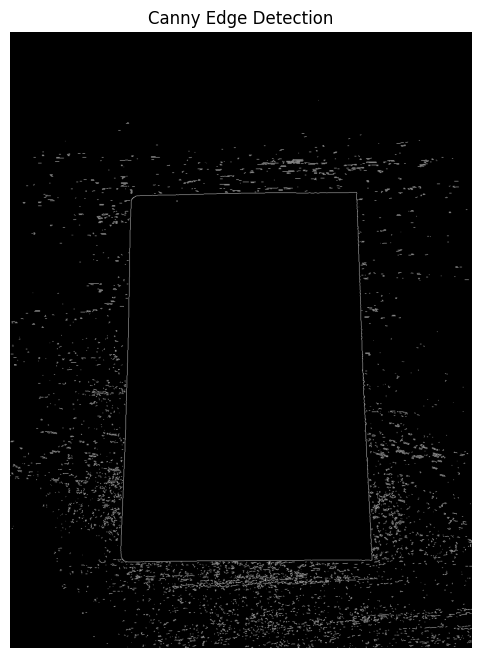

In [25]:
# Apply Canny edge detection
# Convert to grayscale first
object_gray = cv2.cvtColor(object_rgb, cv2.COLOR_RGB2GRAY)

# Apply Canny edge detection
edges = cv2.Canny(object_gray, threshold1=200, threshold2=240)

# Display result
plt.figure(figsize=(10, 8))
plt.imshow(edges, cmap='gray')
plt.title('Canny Edge Detection')
plt.axis('off')
plt.savefig('results_ws4/edge_detection.jpg')
plt.show()

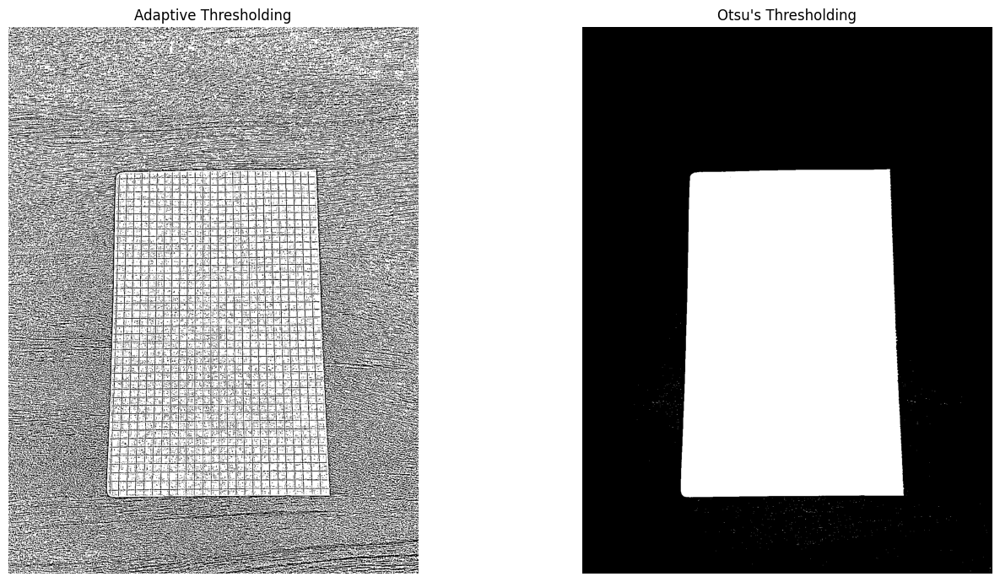

In [26]:
# Apply thresholding to isolate main object
# Adaptive thresholding
adaptive_thresh = cv2.adaptiveThreshold(
    object_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
    cv2.THRESH_BINARY, 11, 2
)

# Otsu's thresholding
_, otsu_thresh = cv2.threshold(object_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display results
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(adaptive_thresh, cmap='gray')
axes[0].set_title('Adaptive Thresholding')
axes[0].axis('off')
axes[1].imshow(otsu_thresh, cmap='gray')
axes[1].set_title("Otsu's Thresholding")
axes[1].axis('off')
plt.tight_layout()
plt.savefig('results_ws4/thresholding_comparison.jpg')
plt.show()

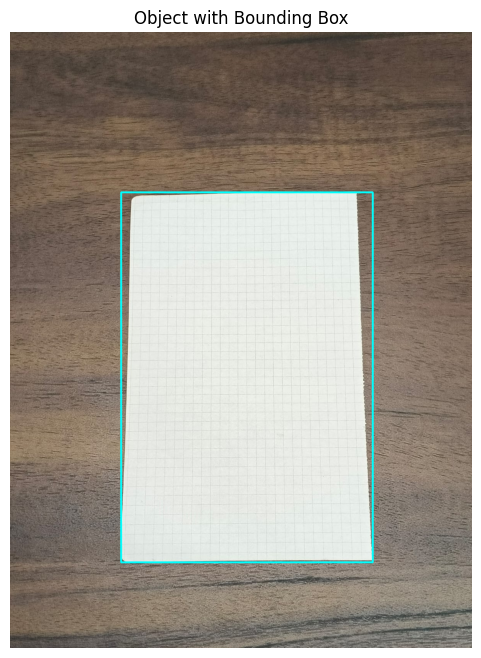

In [27]:
# Create bounding box around segmented object
# Use Otsu thresholding result
binary = otsu_thresh.copy()

# Find contours
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create image copy for drawing
image_with_bbox = object_rgb.copy()

# Draw bounding box around largest contour
if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    cv2.rectangle(image_with_bbox, (x, y), (x+w, y+h), (0, 255, 255), 3) 

# Display result
plt.figure(figsize=(10, 8))
plt.imshow(image_with_bbox)
plt.title('Object with Bounding Box')
plt.axis('off')
plt.savefig('results_ws4/bounding_box.jpg')
plt.show()

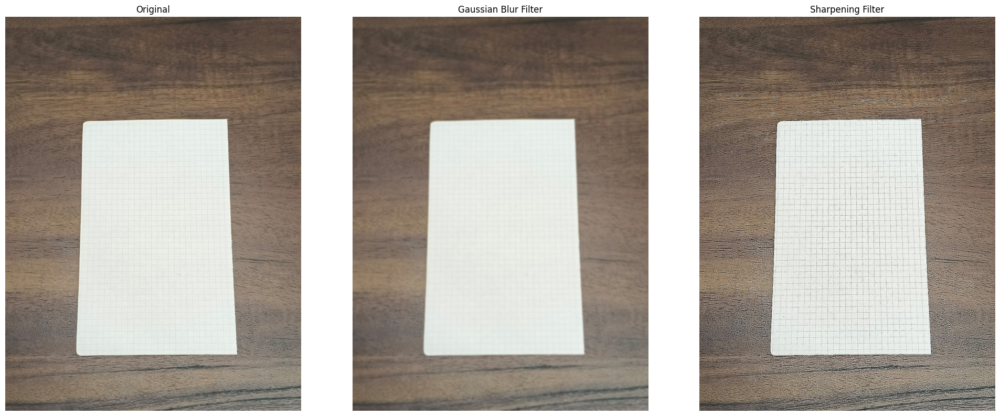

In [28]:
# Apply blur and sharpening filters
# Apply Gaussian blur
blurred = cv2.GaussianBlur(object_rgb, (15, 15), 0)

# Apply sharpening filter
kernel = np.array([[-1, -1, -1],
                   [-1,  9, -1],
                   [-1, -1, -1]])
sharpened = cv2.filter2D(object_rgb, -1, kernel)

# Display comparison
fig, axes = plt.subplots(1, 3, figsize=(20, 8))
axes[0].imshow(object_rgb)
axes[0].set_title('Original')
axes[0].axis('off')
axes[1].imshow(blurred)
axes[1].set_title('Gaussian Blur Filter')
axes[1].axis('off')
axes[2].imshow(sharpened)
axes[2].set_title('Sharpening Filter')
axes[2].axis('off')
plt.tight_layout()
plt.savefig('results_ws4/filter_comparison.jpg')
plt.show()

#### Pengaruh Filter terhadap Detail Gambar

**1. Canny Edge Detection:**
- **Fungsi**: Mendeteksi tepi/edge dalam gambar dengan mencari perubahan intensitas yang tajam
- **Cara kerja**: 
  - Menggunakan gradient untuk menemukan perubahan brightness yang cepat
  - Threshold1 (200) dan Threshold2 (240) menentukan sensitivitas deteksi edge
  - Threshold rendah mendeteksi edge lemah, threshold tinggi hanya untuk edge kuat
- **Hasil**: Gambar binary (hitam-putih) yang menunjukkan outline/kontur objek
- **Aplikasi**: Preprocessing untuk segmentasi, deteksi bentuk, dan pengenalan objek

**2. Thresholding (Adaptive vs Otsu):**

**Adaptive Thresholding:**
- Menghitung threshold **secara lokal** untuk setiap region kecil dalam gambar
- **Keunggulan**: Sangat efektif untuk gambar dengan **pencahayaan tidak merata**
- Cocok untuk background bertekstur karena dapat menyesuaikan dengan variasi lokal
- Parameter block size (11) menentukan ukuran neighborhood untuk perhitungan threshold

**Otsu's Thresholding:**
- Menghitung **single global threshold** optimal berdasarkan histogram
- Mencari threshold yang memaksimalkan variance between-class
- **Keunggulan**: Otomatis dan objektif, tidak perlu manual tuning
- **Kelemahan**: Kurang efektif untuk gambar dengan pencahayaan tidak seragam
- Hasil lebih bersih untuk objek dengan kontras tinggi terhadap background

**3. Bounding Box:**
- Menggunakan `cv2.findContours()` untuk menemukan kontur objek dari hasil thresholding
- Bounding box merepresentasikan **rectangular region** yang mengelilingi objek
- Berguna untuk: object localization, tracking, dan region-based processing
- Dalam implementasi ini, dipilih contour terbesar (largest area) sebagai objek utama

**4. Gaussian Blur Filter:**
- **Efek**: Menghaluskan gambar dengan mengurangi detail dan noise
- **Cara kerja**: Averaging piksel dengan tetangga menggunakan Gaussian kernel (15×15)
- **Dampak pada detail**:
  - Edge menjadi lebih soft dan less defined
  - High-frequency details (tekstur halus) hilang
  - Noise berkurang secara signifikan
- **Aplikasi**: Noise reduction, preprocessing untuk edge detection, artistic effect

**5. Sharpening Filter:**
- **Efek**: Meningkatkan ketajaman dengan menekankan edges dan detail
- **Cara kerja**: Menggunakan kernel yang menambahkan high-pass filtered version ke gambar original
- Kernel `[[-1,-1,-1],[-1,9,-1],[-1,-1,-1]]` menekankan perbedaan dengan tetangga
- **Dampak pada detail**:
  - Edges menjadi lebih tajam dan defined
  - Tekstur dan fine details lebih pronounced
  - Kontras lokal meningkat
  - Noise juga dapat teramplifikasi (efek samping)
- **Aplikasi**: Enhancing photo clarity, medical imaging, printing

**Perbandingan Blur vs Sharpening:**
- **Blur**: Menghilangkan detail → smoothing → low-pass filter
- **Sharpening**: Menekankan detail → enhancement → high-pass filter
- Keduanya adalah operasi konvolusi dengan kernel yang berbeda
- Trade-off antara noise reduction (blur) dan detail preservation (sharpen)

---

### **Soal 4 — Deteksi Wajah dan Filter Digital Kreatif**

* Ambil gambar diri Anda dengan ekspresi wajah **netral**.
* Lakukan **deteksi wajah dan landmark** menggunakan salah satu dari:

  * **MediaPipe**, atau
  * **Dlib**, atau
  * **OpenCV**.
* Buat **overlay filter digital kreatif** karya Anda sendiri, misalnya:

  * topi, kumis, masker, helm, aksesoris, atau bentuk unik lainnya.
  * Filter boleh dibuat dari **gambar eksternal (PNG)** *atau* digambar langsung (misal bentuk lingkaran, garis, poligon, dll).
* Pastikan posisi overlay menyesuaikan **landmark wajah** dengan logis.
* **Gunakan alpha blending sebagai saran** agar hasil tampak lebih natural.
* Tampilkan perbandingan antara **gambar asli** dan **hasil dengan filter**.
* Jelaskan bagaimana Anda menghitung posisi overlay dan tantangan yang dihadapi selama implementasi (gunakan **Markdown**).

In [29]:
# Import MediaPipe for face detection
import mediapipe as mp

# Initialize MediaPipe Face Detection and Face Mesh
mp_face_detection = mp.solutions.face_detection
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

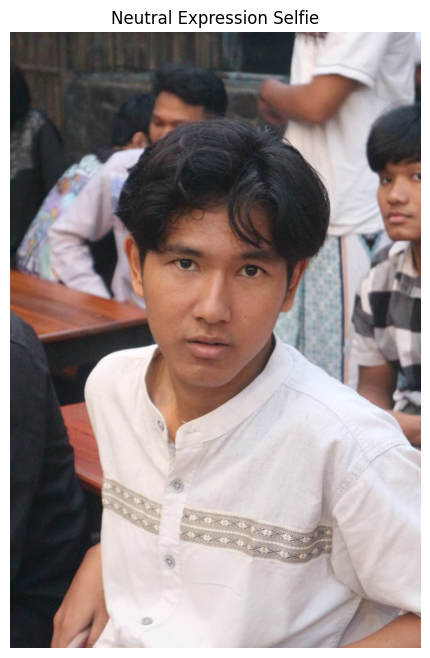

In [30]:
# Cell 15: Load neutral expression selfie
neutral_face_path = os.path.join('assets_ws4', 'neutral_face.jpeg')
neutral_face = cv2.imread(neutral_face_path)

if neutral_face is None:
    print("Error: Neutral face image not found. Please place your image in assets_ws4/neutral_face.jpeg")
else:
    neutral_face_rgb = cv2.cvtColor(neutral_face, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(neutral_face_rgb)
    plt.title('Neutral Expression Selfie')
    plt.axis('off')
    plt.show()

c:\Users\Administrator\Desktop\STM\multimedia-uv\lib\site-packages\google\protobuf\symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


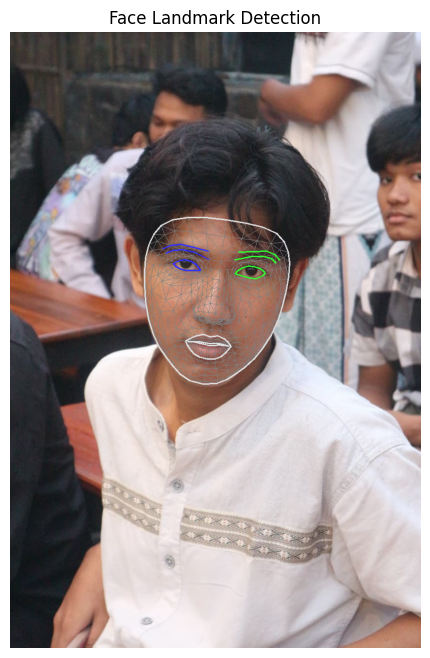

In [31]:
# Detect face landmarks using MediaPipe
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    refine_landmarks=True,
    min_detection_confidence=0.5) as face_mesh:
    
    # Process the image
    results = face_mesh.process(cv2.cvtColor(neutral_face_rgb, cv2.COLOR_RGB2BGR))
    
    # Create a copy for annotation
    annotated_image = neutral_face_rgb.copy()
    
    if results.multi_face_landmarks:
        for face_landmarks in results.multi_face_landmarks:
            # Draw face landmarks
            mp_drawing.draw_landmarks(
                image=annotated_image,
                landmark_list=face_landmarks,
                connections=mp_face_mesh.FACEMESH_TESSELATION,
                landmark_drawing_spec=None,
                connection_drawing_spec=mp_drawing_styles
                .get_default_face_mesh_tesselation_style())
            
            # Draw face contours
            mp_drawing.draw_landmarks(
                image=annotated_image,
                landmark_list=face_landmarks,
                connections=mp_face_mesh.FACEMESH_CONTOURS,
                landmark_drawing_spec=None,
                connection_drawing_spec=mp_drawing_styles
                .get_default_face_mesh_contours_style())

# Display result
plt.figure(figsize=(10, 8))
plt.imshow(annotated_image)
plt.title('Face Landmark Detection')
plt.axis('off')
plt.savefig('results_ws4/face_landmarks.jpg')
plt.show()

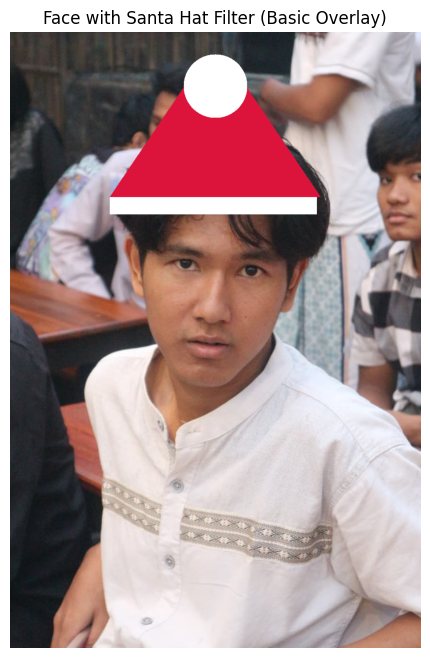

In [32]:
# Create Santa hat overlay filter
# This cell creates a Santa hat positioned above the head using face landmarks
if results.multi_face_landmarks:
    face_landmarks = results.multi_face_landmarks[0]
    
    # Get image dimensions
    h, w, _ = neutral_face_rgb.shape
    
    # Get key landmark coordinates
    forehead = face_landmarks.landmark[10]  # Top of forehead
    left_temple = face_landmarks.landmark[234]  # Left temple
    right_temple = face_landmarks.landmark[454]  # Right temple
    
    forehead_coords = (int(forehead.x * w), int(forehead.y * h))
    left_temple_coords = (int(left_temple.x * w), int(left_temple.y * h))
    right_temple_coords = (int(right_temple.x * w), int(right_temple.y * h))
    
    # Calculate face width based on temple distance
    face_width = right_temple_coords[0] - left_temple_coords[0]
    
    # Create a copy for the filtered image
    santa_hat_image = neutral_face_rgb.copy()
    
    # Calculate Santa hat dimensions
    hat_width = int(face_width * 1.5)  # Hat wider than face
    hat_height = int(hat_width * 0.7)  # Proportional height
    
    # Position hat above forehead
    hat_center_x = (left_temple_coords[0] + right_temple_coords[0]) // 2
    hat_x =(hat_center_x - hat_width // 2) - 10
    hat_y = forehead_coords[1] - int(hat_height * 1)
    
    # Draw Santa hat shape
    # Main red part (triangle/cone shape)
    for y in range(hat_y, hat_y + int(hat_height * 0.85)):
        if 0 <= y < h:
            # Calculate width at this height (narrowing towards top)
            progress = (y - hat_y) / (hat_height * 0.85)
            current_width = int(hat_width * (0.2 + 0.8 * progress))
            x_start = hat_center_x - current_width // 2
            x_end = hat_center_x + current_width // 2
            
            for x in range(max(0, x_start), min(w, x_end)):
                # Red color for Santa hat
                santa_hat_image[y, x] = [220, 20, 60]  # Crimson red
    
    # White trim at bottom of hat
    trim_height = int(hat_height * 0.12)
    trim_y = hat_y + int(hat_height * 0.85)
    for y in range(trim_y, trim_y + trim_height):
        if 0 <= y < h:
            for x in range(max(0, hat_x), min(w, hat_x + hat_width)):
                dist_from_center = abs(x - hat_center_x)
                if dist_from_center < hat_width // 2:
                    santa_hat_image[y, x] = [255, 255, 255]  # White
    
    # White pom-pom at top
    pom_radius = int(hat_width * 0.15)
    pom_center_x = hat_center_x
    pom_center_y = hat_y + int(hat_height * 0.1)
    
    for y in range(max(0, pom_center_y - pom_radius), min(h, pom_center_y + pom_radius)):
        for x in range(max(0, pom_center_x - pom_radius), min(w, pom_center_x + pom_radius)):
            dist = np.sqrt((x - pom_center_x)**2 + (y - pom_center_y)**2)
            if dist <= pom_radius:
                santa_hat_image[y, x] = [255, 255, 255]  # White pom-pom

# Display result
plt.figure(figsize=(10, 8))
plt.imshow(santa_hat_image)
plt.title('Face with Santa Hat Filter (Basic Overlay)')
plt.axis('off')
plt.savefig('results_ws4/santa_hat_basic.jpg')
plt.show()

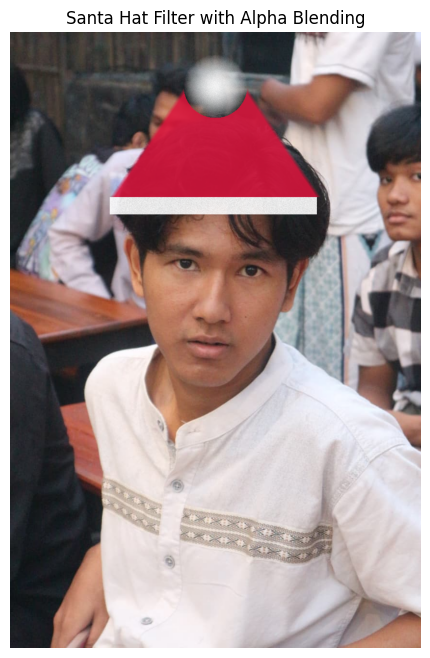

In [33]:
# Advanced Santa hat with alpha blending for natural appearance
if results.multi_face_landmarks:
    face_landmarks = results.multi_face_landmarks[0]
    
    # Get image dimensions
    h, w, _ = neutral_face_rgb.shape
    
    # Get key landmarks
    forehead = face_landmarks.landmark[10]
    left_temple = face_landmarks.landmark[234]
    right_temple = face_landmarks.landmark[454]
    
    forehead_coords = (int(forehead.x * w), int(forehead.y * h))
    left_temple_coords = (int(left_temple.x * w), int(left_temple.y * h))
    right_temple_coords = (int(right_temple.x * w), int(right_temple.y * h))
    
    # Calculate face width and hat dimensions
    face_width = right_temple_coords[0] - left_temple_coords[0]
    hat_width = int(face_width * 1.5)
    hat_height = int(hat_width * 0.7)
    
    # Position hat
    hat_center_x = (left_temple_coords[0] + right_temple_coords[0]) // 2
    hat_x = (hat_center_x - hat_width // 2) -10
    hat_y = forehead_coords[1] - int(hat_height * 1)
    
    # Create overlay with alpha channel (RGBA)
    overlay = np.zeros((h, w, 4), dtype=np.uint8)
    
    # Draw Santa hat on overlay with alpha values
    # Main red part (triangle/cone shape)
    for y in range(hat_y, hat_y + int(hat_height * 0.85)):
        if 0 <= y < h:
            # Calculate width at this height (narrowing towards top)
            progress = (y - hat_y) / (hat_height * 0.85)
            current_width = int(hat_width * (0.2 + 0.8 * progress))
            x_start = hat_center_x - current_width // 2
            x_end = hat_center_x + current_width // 2
            
            for x in range(max(0, x_start), min(w, x_end)):
                # Distance from edge for smooth alpha transition
                dist_from_edge = min(x - x_start, x_end - x)
                edge_softness = min(10, current_width // 10)
                
                if dist_from_edge < edge_softness:
                    alpha = int(220 * (dist_from_edge / edge_softness))
                else:
                    alpha = 220
                
                overlay[y, x] = [220, 20, 60, alpha]  # Red with alpha 
    
    # White trim at bottom with alpha
    trim_height = int(hat_height * 0.12)
    trim_y = hat_y + int(hat_height * 0.85)
    for y in range(trim_y, trim_y + trim_height):
        if 0 <= y < h:
            for x in range(max(0, hat_x), min(w, hat_x + hat_width)):
                dist_from_center = abs(x - hat_center_x)
                if dist_from_center < hat_width // 2:
                    # Add fluffy effect with gradient
                    noise = np.random.randint(-15, 15)
                    alpha = min(255, 230 + noise)
                    overlay[y, x] = [255, 255, 255, alpha]  # White with alpha
    
    # White pom-pom at top with soft edges
    pom_radius = int(hat_width * 0.15)
    pom_center_x = hat_center_x
    pom_center_y = hat_y + int(hat_height * 0.1)
    
    for y in range(max(0, pom_center_y - pom_radius), min(h, pom_center_y + pom_radius)):
        for x in range(max(0, pom_center_x - pom_radius), min(w, pom_center_x + pom_radius)):
            dist = np.sqrt((x - pom_center_x)**2 + (y - pom_center_y)**2)
            if dist <= pom_radius:
                # Soft edge with distance-based alpha
                alpha_factor = 1.0 - (dist / pom_radius) ** 2
                alpha = int(240 * alpha_factor)
                noise = np.random.randint(-10, 10)
                alpha = max(0, min(255, alpha + noise))
                overlay[y, x] = [255, 255, 255, alpha]  # White pom-pom
    
    # Apply alpha blending
    result_alpha = neutral_face_rgb.copy().astype(np.float32)
    alpha_channel = overlay[:, :, 3] / 255.0  # Normalize alpha channel
    
    for c in range(3):  # For each BGR color channel
        result_alpha[:, :, c] = (1 - alpha_channel) * result_alpha[:, :, c] + \
                                alpha_channel * overlay[:, :, c]
    
    result_alpha = result_alpha.astype(np.uint8)

# Display the result with alpha blending
plt.figure(figsize=(10, 8))
plt.imshow(result_alpha)
plt.title('Santa Hat Filter with Alpha Blending')
plt.axis('off')
plt.savefig('results_ws4/santa_hat_alpha_blended.jpg')
plt.show()

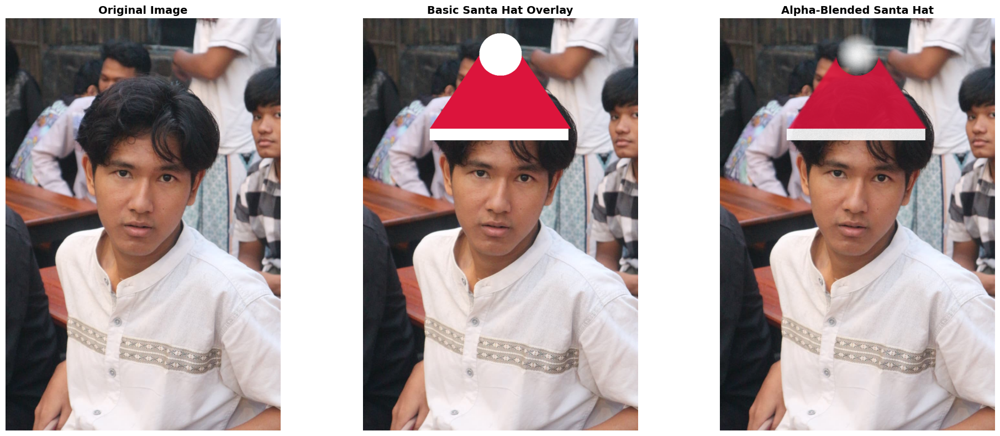

True

In [34]:
# Comparison: Original vs Filtered images
fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# Original image
axes[0].imshow(neutral_face_rgb)
axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Basic overlay (no alpha blending)
axes[1].imshow(santa_hat_image)
axes[1].set_title('Basic Santa Hat Overlay', fontsize=14, fontweight='bold')
axes[1].axis('off')

# Alpha blended overlay
axes[2].imshow(result_alpha)
axes[2].set_title('Alpha-Blended Santa Hat', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('results_ws4/santa_hat_comparison.jpg', dpi=150, bbox_inches='tight')
plt.show()

# Save final result
cv2.imwrite('results_ws4/santa_hat_final.png', cv2.cvtColor(result_alpha, cv2.COLOR_RGB2BGR))

#### Penjelasan bagaimana menghitung posisi overlay dan tantangan yang dihadapi selama implementasi

**1. Posisi Overlay**
```python
# Hitung lebar wajah dari titik samping kepala
face_width = right_temple.x - left_temple.x

# Tentukan ukuran topi (50% lebih lebar dari wajah)
hat_width = face_width * 1.5
hat_height = hat_width * 0.7

# Hitung posisi tengah topi
hat_center_x = (left_temple.x + right_temple.x) // 2

# Posisi vertikal: di atas dahi
hat_y = forehead.y - hat_height
```
- **Landmark kunci**: Titik 10 (dahi), 234 & 454 (samping kepala)
- **Proporsi**: Topi 1.5x lebar wajah agar terlihat natural
- **Penempatan**: Pusat topi sejajar dengan pusat wajah, diposisikan di atas dahi

**2. Alpha Channel untuk Blending Alami**
```python
# Buat lapisan transparan (RGBA)
overlay = np.zeros((height, width, 4), dtype=np.uint8)

# Atur nilai alpha (0-255) untuk setiap piksel:
# - 255 = 100% tertutup (opaque)
# - 0 = 100% transparan
overlay[y, x] = [B, G, R, alpha]

# Campur dengan gambar asli:
result = (1 - alpha) * original + alpha * overlay
```

**Cara Kerja Alpha:**
| Bagian Topi      | Nilai Alpha               | Efek Visual               |
|------------------|---------------------------|---------------------------|
| Tepi merah       | 0 → 220 (gradual)         | Transisi halus, tidak tajam |
| Trim putih       | 215-245 (acak)            | Tekstur "bulu" natural    |
| Pom-pom          | Pusat 240 → tepi 0        | Efek bulat dan berkilau   |

**Rumus Blending:**
```
Warna Akhir = (1 - α) × Warna Asli + α × Warna Topi
```
Contoh: Jika α=0.7 → 70% warna topi + 30% warna asli

**Tantangan selama implementasi:**
Menyesuaikan ukuran topi berdasarkan dimensi wajah yang berbeda-beda memerlukan perhitungan proporsional yang tepat.
Mengatur nilai alpha agar transisi antara topi dan wajah terlihat alami, terutama di tepi topi.
Jika wajah sedikit miring atau tertutup rambut, penempatan topi bisa menjadi sulit.


### **Soal 5 — Perspektif dan Peningkatan Kualitas Citra**

* Ambil gambar **objek datar** seperti karya tangan di kertas, tulisan di papan tulis, atau foto produk di meja dengan kondisi pencahayaan atau sudut yang tidak ideal.
* Lakukan **preprocessing** untuk memperbaiki tampilan agar lebih rapi dan jelas, dengan langkah-langkah:

  * Konversi ke **grayscale**.
  * **Koreksi perspektif (transformasi homografi)** menggunakan **4 titik manual** agar objek terlihat sejajar dan tidak terdistorsi.
  * Terapkan **thresholding adaptif atau Otsu** (pilih salah satu, dan jelaskan alasan pilihan Anda).
* Tampilkan **setiap tahap pemrosesan dalam satu grid** agar mudah dibandingkan.
* Jelaskan fungsi masing-masing tahap dan bagaimana teknik ini meningkatkan kualitas visual citra (gunakan **Markdown**).

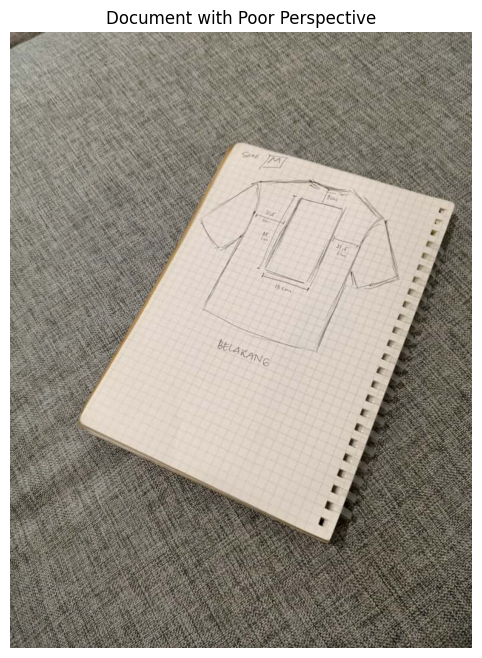

In [35]:
# Load document image with poor perspective
doc_path = os.path.join('assets_ws4', 'skewed_document.jpeg')
doc_img = cv2.imread(doc_path)

if doc_img is None:
    print("Error: Document image not found. Please place your image in assets_ws4/skewed_document.jpeg")
else:
    doc_rgb = cv2.cvtColor(doc_img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(doc_rgb)
    plt.title('Document with Poor Perspective')
    plt.axis('off')
    plt.show()

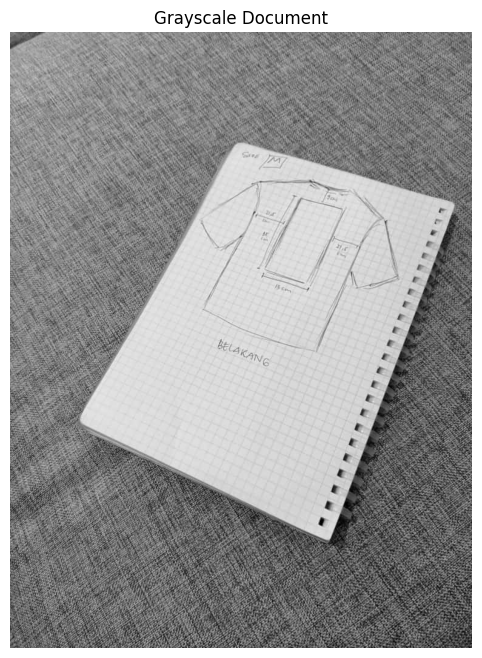

In [36]:
# Convert to grayscale
doc_gray = cv2.cvtColor(doc_rgb, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(10, 8))
plt.imshow(doc_gray, cmap='gray')
plt.title('Grayscale Document')
plt.axis('off')
plt.show()

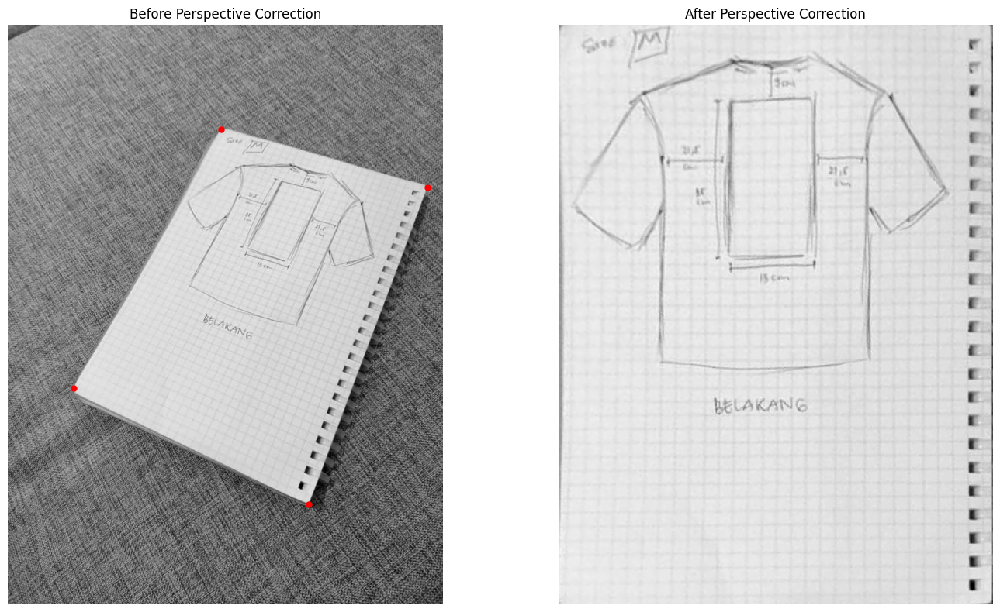

In [ ]:
# Apply perspective correction using homography
# Format: [[top-left], [top-right], [bottom-left], [bottom-right]]
src_points = np.array([
    [373, 182],    # Top-left
    [735, 285],   # Top-right
    [115, 637],   # Bottom-left
    [527, 840]   # Bottom-right
], dtype=np.float32)

# Calculate dimensions for the output image
width_top = np.linalg.norm(src_points[0] - src_points[1])
width_bottom = np.linalg.norm(src_points[2] - src_points[3])
height_left = np.linalg.norm(src_points[0] - src_points[2])
height_right = np.linalg.norm(src_points[1] - src_points[3])

# Use average dimensions for output
dst_width = int((width_top + width_bottom) / 2)
dst_height = int((height_left + height_right) / 2)

# Define destination points (rectangle)
dst_points = np.array([
    [0, 0],
    [dst_width - 1, 0],
    [0, dst_height - 1],
    [dst_width - 1, dst_height - 1]
], dtype=np.float32)

# Calculate homography matrix and apply perspective transform
h_matrix, _ = cv2.findHomography(src_points, dst_points)
doc_corrected = cv2.warpPerspective(doc_gray, h_matrix, (dst_width, dst_height))

# Display comparison
fig, axes = plt.subplots(1, 2, figsize=(15, 8))
axes[0].imshow(doc_gray, cmap='gray')
axes[0].set_title('Before Perspective Correction')
axes[0].axis('off')
# Mark the source points
for point in src_points:
    axes[0].plot(point[0], point[1], 'ro', markersize=5)
    
axes[1].imshow(doc_corrected, cmap='gray')
axes[1].set_title('After Perspective Correction')
axes[1].axis('off')
plt.tight_layout()
plt.savefig('results_ws4/perspective_correction.jpg')
plt.show()

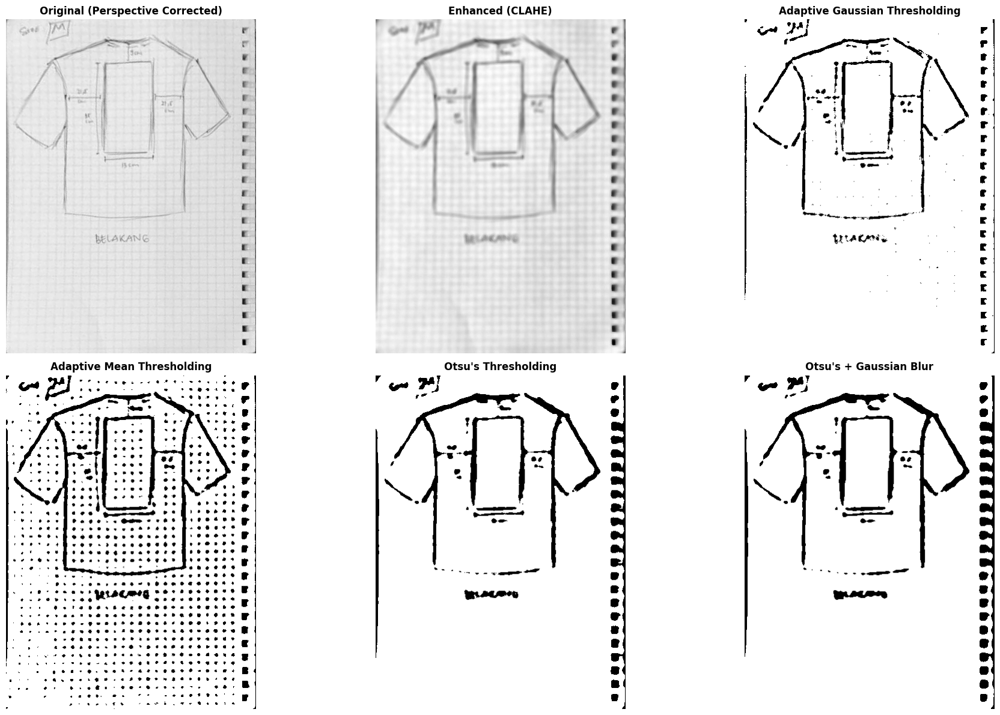

In [38]:
# Apply improved thresholding with better preprocessing
# Step 1: Denoise the image with bilateral filter (preserves edges better)
denoised = cv2.bilateralFilter(doc_corrected, d=9, sigmaColor=75, sigmaSpace=75)

# Step 2: Enhance contrast using CLAHE (Contrast Limited Adaptive Histogram Equalization)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
enhanced = clahe.apply(denoised)

# Step 3: Apply different thresholding methods
# Adaptive Gaussian thresholding (better for uneven lighting)
adaptive_gaussian = cv2.adaptiveThreshold(
    enhanced, 
    255, 
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
    cv2.THRESH_BINARY, 
    blockSize=15,  # Smaller block size for finer detail
    C=8  # Higher C value to reduce noise
)

# Adaptive Mean thresholding
adaptive_mean = cv2.adaptiveThreshold(
    enhanced, 
    255, 
    cv2.ADAPTIVE_THRESH_MEAN_C, 
    cv2.THRESH_BINARY, 
    blockSize=15,
    C=8
)

# Otsu's thresholding
_, otsu_thresh = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Otsu's with Gaussian blur preprocessing
blurred_for_otsu = cv2.GaussianBlur(enhanced, (5, 5), 0)
_, otsu_gaussian = cv2.threshold(blurred_for_otsu, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display all thresholding methods for comparison
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Original corrected
axes[0, 0].imshow(doc_corrected, cmap='gray')
axes[0, 0].set_title('Original (Perspective Corrected)', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

# Enhanced with CLAHE
axes[0, 1].imshow(enhanced, cmap='gray')
axes[0, 1].set_title('Enhanced (CLAHE)', fontsize=12, fontweight='bold')
axes[0, 1].axis('off')

# Adaptive Gaussian
axes[0, 2].imshow(adaptive_gaussian, cmap='gray')
axes[0, 2].set_title('Adaptive Gaussian Thresholding', fontsize=12, fontweight='bold')
axes[0, 2].axis('off')

# Adaptive Mean
axes[1, 0].imshow(adaptive_mean, cmap='gray')
axes[1, 0].set_title('Adaptive Mean Thresholding', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

# Otsu's
axes[1, 1].imshow(otsu_thresh, cmap='gray')
axes[1, 1].set_title("Otsu's Thresholding", fontsize=12, fontweight='bold')
axes[1, 1].axis('off')

# Otsu with Gaussian blur
axes[1, 2].imshow(otsu_gaussian, cmap='gray')
axes[1, 2].set_title("Otsu's + Gaussian Blur", fontsize=12, fontweight='bold')
axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig('results_ws4/document_thresholding_comparison.jpg', dpi=150, bbox_inches='tight')
plt.show()

# Choose the best result
# Adaptive Gaussian works best for documents with uneven lighting
final_result = adaptive_gaussian

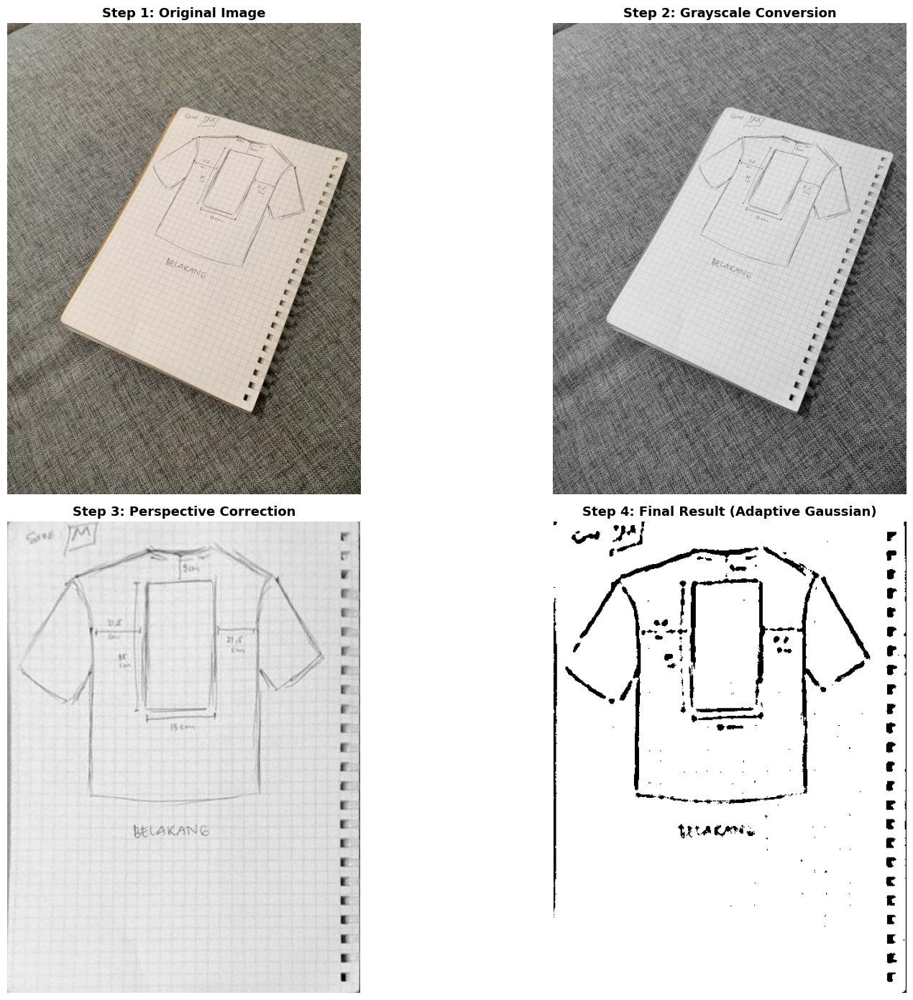

In [39]:
# Display all processing stages in a grid
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Original image
axes[0, 0].imshow(doc_rgb)
axes[0, 0].set_title('Step 1: Original Image', fontsize=13, fontweight='bold')
axes[0, 0].axis('off')

# Grayscale
axes[0, 1].imshow(doc_gray, cmap='gray')
axes[0, 1].set_title('Step 2: Grayscale Conversion', fontsize=13, fontweight='bold')
axes[0, 1].axis('off')

# After perspective correction
axes[1, 0].imshow(doc_corrected, cmap='gray')
axes[1, 0].set_title('Step 3: Perspective Correction', fontsize=13, fontweight='bold')
axes[1, 0].axis('off')

# Final result with thresholding
axes[1, 1].imshow(final_result, cmap='gray')
axes[1, 1].set_title('Step 4: Final Result (Adaptive Gaussian)', fontsize=13, fontweight='bold')
axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig('results_ws4/document_processing_stages.jpg', dpi=150, bbox_inches='tight')
plt.show()

#### Fungsi Setiap Tahap Pemrosesan dan Peningkatan Kualitas Visual

**Tahap 1: Konversi ke Grayscale**
- **Fungsi**: Mengurangi kompleksitas dari 3 channels (RGB) menjadi 1 channel (intensity only)
- **Manfaat**: 
  - Menghilangkan noise dari variasi warna
  - Fokus pada struktur dan konten (teks/tulisan) tanpa distraksi warna
  - Mengurangi computational cost untuk tahap selanjutnya
  - Format standar untuk document processing
- **Peningkatan**: Simplifikasi data memudahkan algoritma untuk fokus pada informasi penting (teks)

**Tahap 2: Koreksi Perspektif (Perspective Transform/Homography)**
- **Fungsi**: Mentransformasi gambar dari sudut pandang miring menjadi view frontal
- **Metode**: 
  - Menggunakan 4 titik sumber (corners dokumen yang terdistorsi)
  - Mapping ke 4 titik tujuan (rectangular shape yang ideal)
  - Homography matrix menghitung transformasi proyektif
- **Peningkatan**:
  - Dokumen menjadi **sejajar dan tidak miring**
  - Aspek rasio yang benar memudahkan pembacaan
  - Menghilangkan distorsi perspektif
  - Essential untuk OCR (Optical Character Recognition)
  - Standardisasi format untuk batch processing

**Tahap 3: Preprocessing untuk Thresholding**

**a. Bilateral Filter (Denoising):**
- **Fungsi**: Mengurangi noise sambil **mempertahankan edges**
- **Keunggulan**: Berbeda dari Gaussian blur, bilateral filter edge-aware
- **Parameters**: d=9, sigmaColor=75, sigmaSpace=75
- **Peningkatan**: Clean background tanpa menghilangkan detail teks

**b. CLAHE (Contrast Limited Adaptive Histogram Equalization):**
- **Fungsi**: Meningkatkan kontras secara **lokal** dengan adaptive histogram equalization
- **Why CLAHE vs Standard HE**: 
  - Standard histogram equalization → over-amplification di area terang
  - CLAHE → clip limit mencegah over-enhancement
  - Tile-based (8×8) → adaptif terhadap variasi lokal
- **Peningkatan**: Teks yang redup menjadi lebih jelas, kontras lebih seragam

**Tahap 4: Thresholding - Pemilihan Metode**

**Mengapa Adaptive Gaussian Thresholding?**

1. **Keunggulan untuk Document:**
   - Dokumen sering memiliki **pencahayaan tidak merata** (shadow, highlight)
   - Global threshold (Otsu) menggunakan single value → gagal di area gelap/terang
   - Adaptive threshold menghitung threshold secara **lokal** (per block)

2. **Gaussian vs Mean Adaptive:**
   - **Gaussian**: Weighted average → center pixel lebih berpengaruh → smoother
   - **Mean**: Simple average → semua pixel sama penting → lebih sensitive noise
   - Gaussian lebih robust untuk texture background

3. **Parameter Tuning:**
   - **Block size (15)**: Ukuran neighborhood untuk perhitungan threshold
     - Terlalu kecil → terlalu sensitive, banyak noise
     - Terlalu besar → kehilangan detail lokal
   - **C value (8)**: Constant yang dikurangi dari mean/gaussian
     - Nilai lebih tinggi → lebih aggressive dalam mendeteksi foreground
     - Helps reduce background noise

**Hasil Akhir dan Manfaatnya:**

1. **Readability**: Teks menjadi hitam pekat pada background putih bersih
2. **OCR-Ready**: Format binary optimal untuk text recognition algorithms
3. **File Size**: Binary image (1-bit) jauh lebih kecil dari grayscale (8-bit)
4. **Printing**: Perfect untuk printing atau photocopying
5. **Standardization**: Menghilangkan variasi pencahayaan → consistent output

**Kesimpulan Teknis:**
Kombinasi **perspective correction + CLAHE + adaptive thresholding** adalah pipeline standar untuk document scanning/digitization karena:
- Mengatasi masalah geometri (perspective)
- Mengatasi masalah photometric (lighting, contrast)
- Menghasilkan output yang clean dan machine-readable
- Robust terhadap variasi kondisi capture (angle, lighting, background)

---

### Referensi
- [OpenCV Documentation](https://docs.opencv.org/)
- [MediaPipe Face Mesh](https://google.github.io/mediapipe/solutions/face_mesh.html)
- [Qwen](https://chat.qwen.ai/s/a7bcdfce-f75d-4f00-ba09-d49d6374abb0?fev=0.0.245)
- [Github Copilot](https://github.com/features/copilot)



### **Aturan Umum Pengerjaan**

* Kerjakan secara **mandiri**.
* Bantuan AI (seperti ChatGPT, Copilot, dsb.) diperbolehkan **dengan bukti percakapan** (screenshot / link / script percakapan).
* Source code antar mahasiswa harus berbeda.
* Jika mendapat bantuan teman, tuliskan nama dan NIM teman yang membantu.
* Plagiarisme akan dikenakan sanksi sesuai aturan akademik ITERA.
* Cantumkan seluruh **credit dan referensi** yang digunakan di bagian akhir notebook.
* Penjelasan setiap soal ditulis dalam **Markdown**, bukan di dalam komentar kode.

---

### **Aturan Pengumpulan**

* Semua file kerja Anda (notebook `.ipynb`, gambar, dan hasil) **wajib diunggah ke GitHub repository tugas sebelumnya**.

  * Gunakan struktur folder berikut di dalam repo Anda:

    ```
    /Nama_NIM_Repo/ # Nama repo sebelumnya
      ├── assets_ws4/     # berisi semua gambar atau video asli (input)
      ├── results_ws4/    # berisi semua hasil modifikasi dan output
      ├── worksheet4.ipynb
      └── NIM_Worksheet4.pdf
    ```
* File yang dikumpulkan ke **Tally** hanya berupa **hasil PDF** dari notebook Anda, dengan format nama:

  ```
  NIM_Worksheet4.pdf
  ```
* Pastikan notebook telah dijalankan penuh sebelum diekspor ke PDF.
* Sertakan tautan ke repository GitHub Anda di bagian atas notebook atau di halaman pertama PDF.

---

### ✅ **Catatan Akhir**

> Worksheet 4 ini bertujuan mengasah pemahaman Anda tentang manipulasi citra digital secara praktis. Gunakan kreativitas Anda untuk menghasilkan hasil visual yang menarik dan penjelasan konseptual yang jelas.